# Welcome to the notebook 🙂

Installing dependencies

In [1]:
!pip install tensorflow==2.11
!pip install visualkeras

### Step 1 - Importing the Dataset

In [2]:
import numpy as np
import pandas as pd

# Importing neural network modules
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, BatchNormalization, LeakyReLU, Dropout
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout

# Importing some machine learning modules
from sklearn.utils import shuffle
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB

from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split

# Import data visualization modules
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import visualkeras
print("Modules are imported!")

Modules are imported!


Importing the data

In [3]:
data = pd.read_csv("Creditcard_dataset.csv")
data.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,1,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
1,7,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,40.80,0
2,10,1.449044,-1.176339,0.913860,-1.375667,-1.971383,-0.629152,-1.423236,0.048456,-1.720408,...,-0.009302,0.313894,0.027740,0.500512,0.251367,-0.129478,0.042850,0.016253,7.80,0
3,10,0.384978,0.616109,-0.874300,-0.094019,2.924584,3.317027,0.470455,0.538247,-0.558895,...,0.049924,0.238422,0.009130,0.996710,-0.767315,-0.492208,0.042472,-0.054337,9.99,0
4,11,1.069374,0.287722,0.828613,2.712520,-0.178398,0.337544,-0.096717,0.115982,-0.221083,...,-0.036876,0.074412,-0.071407,0.104744,0.548265,0.104094,0.021491,0.021293,27.50,0


Check the data shape

In [4]:
data.shape

(50492, 31)

Let's see how many genuine and limited fraudulent records we have

In [5]:
data.Class.value_counts()

0    50000
1      492
Name: Class, dtype: int64

### Step 2 - Data Preprocessing and Exploration

*   Removing all the rows with `Nan` values
*   Removing `Time` column
*   Feature Scaling `Amount` column
*   Split the data into features and labels
*   Data Exploration


Removing the rows `Nan` values in the dataset

In [6]:
data.dropna(inplace=True)
data.shape

(50492, 31)

Removing Time column

In [7]:
data = data.drop(axis = 1,columns='Time')
data.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
1,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,1.249376,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,40.80,0
2,1.449044,-1.176339,0.913860,-1.375667,-1.971383,-0.629152,-1.423236,0.048456,-1.720408,1.626659,...,-0.009302,0.313894,0.027740,0.500512,0.251367,-0.129478,0.042850,0.016253,7.80,0
3,0.384978,0.616109,-0.874300,-0.094019,2.924584,3.317027,0.470455,0.538247,-0.558895,0.309755,...,0.049924,0.238422,0.009130,0.996710,-0.767315,-0.492208,0.042472,-0.054337,9.99,0
4,1.069374,0.287722,0.828613,2.712520,-0.178398,0.337544,-0.096717,0.115982,-0.221083,0.460230,...,-0.036876,0.074412,-0.071407,0.104744,0.548265,0.104094,0.021491,0.021293,27.50,0


Feature Scaling of Amount column

In [8]:
scaler = StandardScaler()
data['Amount'] = scaler.fit_transform(data[['Amount']])
data.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0.150105,0
1,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,1.249376,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,-0.199848,0
2,1.449044,-1.176339,0.913860,-1.375667,-1.971383,-0.629152,-1.423236,0.048456,-1.720408,1.626659,...,-0.009302,0.313894,0.027740,0.500512,0.251367,-0.129478,0.042850,0.016253,-0.339490,0
3,0.384978,0.616109,-0.874300,-0.094019,2.924584,3.317027,0.470455,0.538247,-0.558895,0.309755,...,0.049924,0.238422,0.009130,0.996710,-0.767315,-0.492208,0.042472,-0.054337,-0.330223,0
4,1.069374,0.287722,0.828613,2.712520,-0.178398,0.337544,-0.096717,0.115982,-0.221083,0.460230,...,-0.036876,0.074412,-0.071407,0.104744,0.548265,0.104094,0.021491,0.021293,-0.256128,0


Let's split the genuine and fraud records into separate dataframes

In [9]:
data_fraud = data[data.Class==1]
data_genuine = data[data.Class==0]


Split the data into features and labels

In [10]:
x = data.drop("Class", axis = 1)
y = data.Class

Data Exploration
  - Apply PCA to reduce the dimensionality of features `X` into two dimensions
  - Use a scatter plot to visualize our data

In [11]:
pca = PCA(2)
transformed_data = pca.fit_transform(x)
df = pd.DataFrame(transformed_data)
df['label'] = y
df

,0,1,label
0,-0.447839,1.197493,0
1,-0.582388,0.257976,0
2,-0.939390,-0.728297,0
3,-0.630763,-0.499165,0
4,-0.536286,-1.055403,0
...,...,...,...
50487,10.855742,-2.787251,1
50488,6.927748,-4.949603,1
50489,7.038191,-2.785045,1
50490,11.649169,-1.991634,1


Let's Use a scatter plot to visualize our data

In [12]:
px.scatter(df, x = 0, y = 1, color = df.label.astype(str))

### Step 3 - Building the Generator Model

Write a method to create the Generator model architecture

In [13]:
def build_generator():
  model = Sequential()
  model.add(Dense(32, activation = 'relu', input_dim = 29, kernel_initializer = 'he_uniform' ))
  model.add(BatchNormalization())

  model.add(Dense(64, activation = 'relu'))
  model.add(BatchNormalization())

  model.add(Dense(128, activation = 'relu'))
  model.add(BatchNormalization())

  model.add(Dense(29, activation = 'linear'))
  model.summary()
  visualkeras.layered_view(model,legend=True,to_file='output1.png')

  return model

build_generator()



Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                960       
                                                                 
 batch_normalization (BatchN  (None, 32)               128       
 ormalization)                                                   
                                                                 
 dense_1 (Dense)             (None, 64)                2112      
                                                                 
 batch_normalization_1 (Batc  (None, 64)               256       
 hNormalization)                                                 
                                                                 
 dense_2 (Dense)             (None, 128)               8320      
                                                                 
 batch_normalization_2 (Batc  (None, 128)              5

### Step 4 - Building the Discriminator Model

Write a method to create the Discriminator model architecture

In [14]:
def build_discriminator():
   model = Sequential()
   model.add(Dense(32, activation = 'relu', input_dim = 29, kernel_initializer = 'he_uniform' ))


   model.add(Dense(64, activation = 'relu'))
   model.add(Dense(32, activation = 'relu'))
   model.add(Dense(32, activation = 'relu'))
   model.add(Dense(16, activation = 'relu'))

   model.add(Dense(1, activation = 'sigmoid'))
   model.compile(optimizer = 'adam', loss = 'binary_crossentropy' )
   visualkeras.layered_view(model,legend=True,to_file='output2.png')
   model.summary()
   return model

build_discriminator()





Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 32)                960       
                                                                 
 dense_5 (Dense)             (None, 64)                2112      
                                                                 
 dense_6 (Dense)             (None, 32)                2080      
                                                                 
 dense_7 (Dense)             (None, 32)                1056      
                                                                 
 dense_8 (Dense)             (None, 16)                528       
                                                                 
 dense_9 (Dense)             (None, 1)                 17        
                                                                 
Total params: 6,753
Trainable params: 6,753
Non-traina

### Step 5 - Combine Generator and Discriminator models to Build The GAN

In [15]:
def build_gan(generator,discriminator):
   discriminator.trainable = False
   gan_input = Input(shape = generator.input_shape[1],)
   x = generator(gan_input)
   gan_output = discriminator(x)
   gan = Model(gan_input, gan_output)
   visualkeras.layered_view(gan ,legend=True,to_file='output3.png')
   gan.summary()
   return gan




Let's create a method that generates synthetic data using the Generator

In [16]:
def generate_synthetic_data(generator, num_samples):
   noise = np.random.normal(0,1,(num_samples, generator.input_shape[1]))
   fake_data = generator.predict(noise)
   return fake_data

### Step 6 - Train and evaluate our GAN
*    Defining some variables
*    Creating our GAN
*    Training the GAN
*    Monitor the GAN performance using PCA




In [17]:
def monitor_generator(generator):
    # Initialize a PCA (Principal Component Analysis) object with 2 components
    pca = PCA(n_components=2)

    # Drop the 'Class' column from the fraud dataset to get real data
    real_fraud_data = data_fraud.drop("Class", axis=1)

    # Transform the real fraud data using PCA
    transformed_data_real = pca.fit_transform(real_fraud_data.values)

    # Create a DataFrame for the transformed real data and add a 'label' column with the value 'real'
    df_real = pd.DataFrame(transformed_data_real)
    df_real['label'] = "real"

    # Generate synthetic fraud data using the provided generator and specify the number of samples (492 in this case)
    synthetic_fraud_data = generate_synthetic_data(generator, 492)

    # Transform the synthetic fraud data using PCA
    transformed_data_fake = pca.fit_transform(synthetic_fraud_data)

    # Create a DataFrame for the transformed fake data and add a 'label' column with the value 'fake'
    df_fake = pd.DataFrame(transformed_data_fake)
    df_fake['label'] = "fake"

    # Concatenate the real and fake data DataFrames
    df_combined = pd.concat([df_real, df_fake])

    # Create a scatterplot to visualize the data points, using the first and second PCA components as x and y, respectively,
    # and color points based on the 'label' column, with a size of 10
    plt.figure()
    sns.scatterplot(data=df_combined, x=0, y=1, hue='label', s=10)
    plt.show()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10 (Dense)            (None, 32)                960       
                                                                 
 batch_normalization_3 (Batc  (None, 32)               128       
 hNormalization)                                                 
                                                                 
 dense_11 (Dense)            (None, 64)                2112      
                                                                 
 batch_normalization_4 (Batc  (None, 64)               256       
 hNormalization)                                                 
                                                                 
 dense_12 (Dense)            (None, 128)               8320      
                                                                 
 batch_normalization_5 (Batc  (None, 128)             

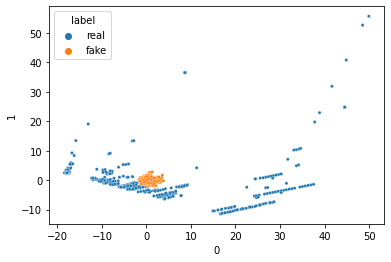

16/16 [==============================] - 0s 2ms/step


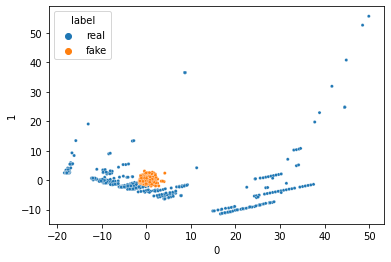

16/16 [==============================] - 0s 1ms/step


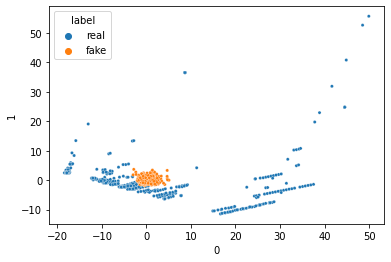

16/16 [==============================] - 0s 2ms/step


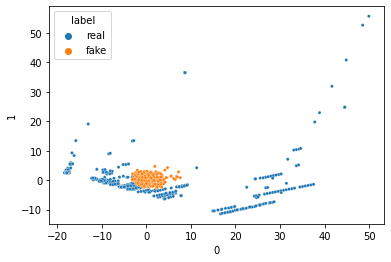

16/16 [==============================] - 0s 2ms/step


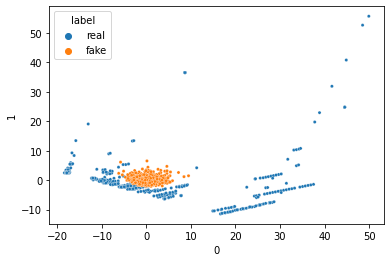

16/16 [==============================] - 0s 2ms/step


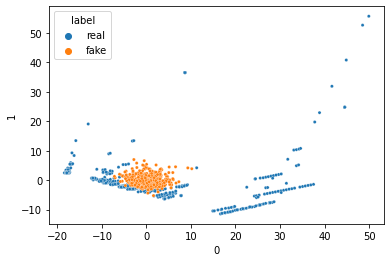

16/16 [==============================] - 0s 2ms/step


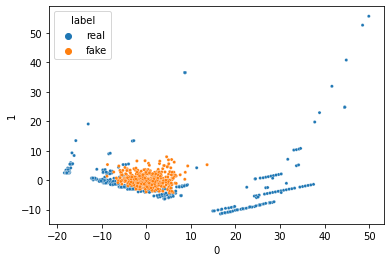

16/16 [==============================] - 0s 2ms/step


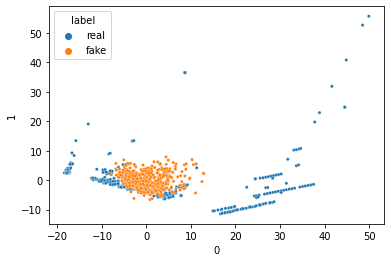

16/16 [==============================] - 0s 1ms/step


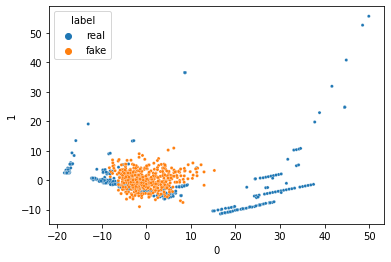

16/16 [==============================] - 0s 1ms/step


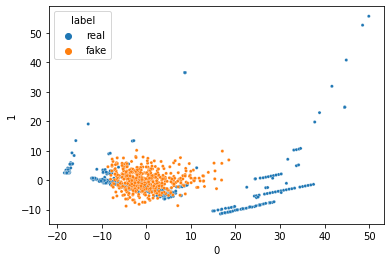

16/16 [==============================] - 0s 2ms/step


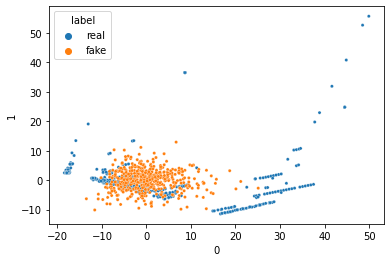

16/16 [==============================] - 0s 3ms/step


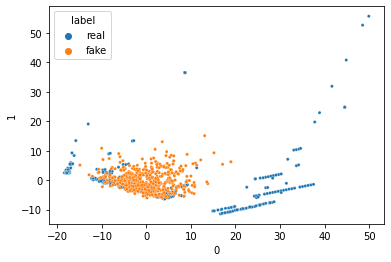

16/16 [==============================] - 0s 2ms/step


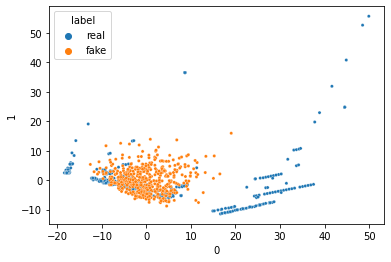

16/16 [==============================] - 0s 1ms/step


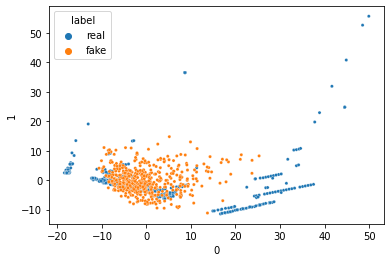

16/16 [==============================] - 0s 2ms/step


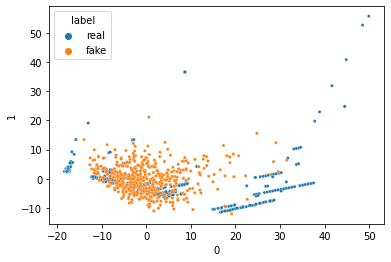

16/16 [==============================] - 0s 2ms/step


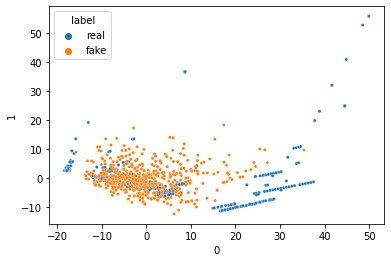

16/16 [==============================] - 0s 1ms/step


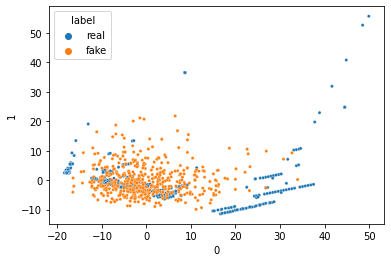

16/16 [==============================] - 0s 5ms/step


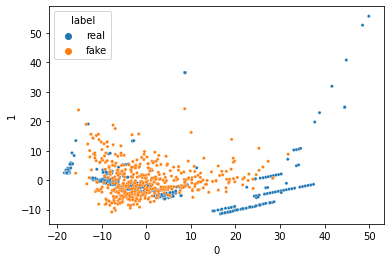

16/16 [==============================] - 0s 2ms/step


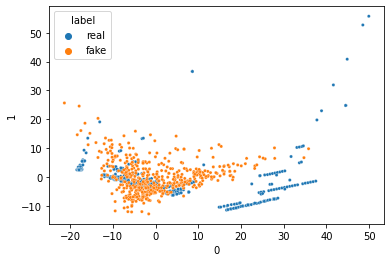

16/16 [==============================] - 0s 2ms/step


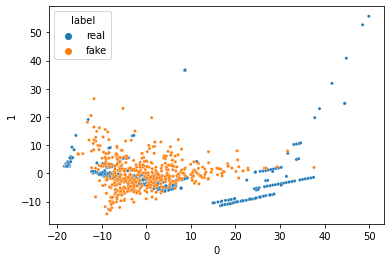

16/16 [==============================] - 0s 1ms/step


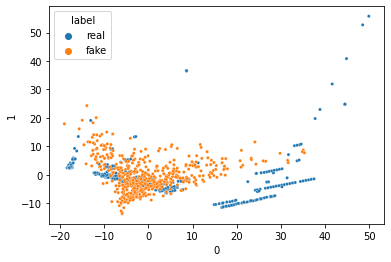

16/16 [==============================] - 0s 2ms/step


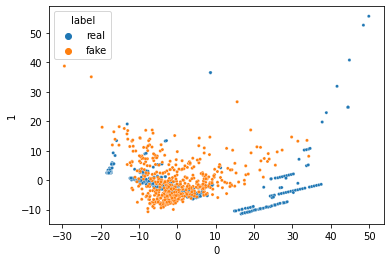

16/16 [==============================] - 0s 1ms/step


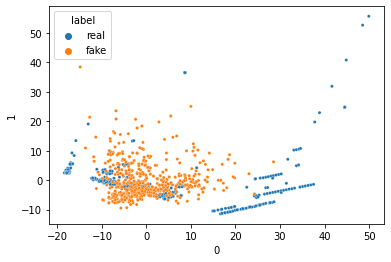

16/16 [==============================] - 0s 1ms/step


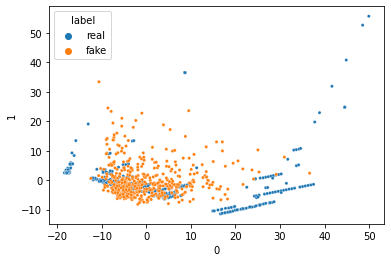

16/16 [==============================] - 0s 2ms/step


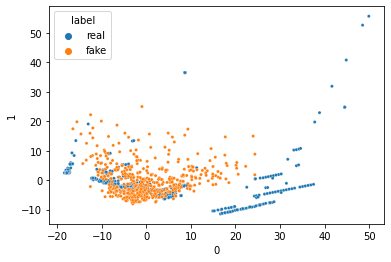

16/16 [==============================] - 0s 1ms/step


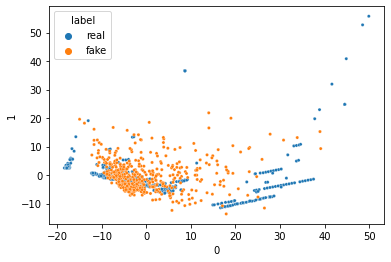

16/16 [==============================] - 0s 1ms/step


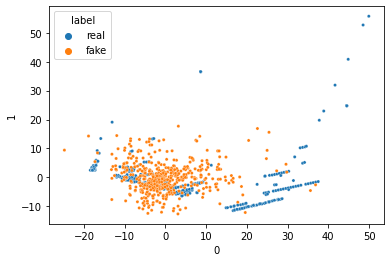

16/16 [==============================] - 0s 2ms/step


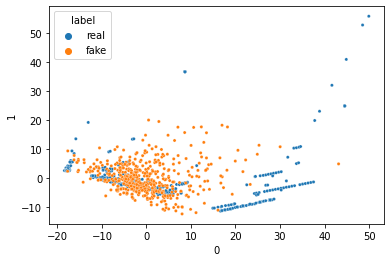

16/16 [==============================] - 0s 1ms/step


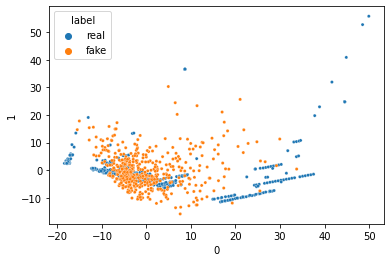

16/16 [==============================] - 0s 2ms/step


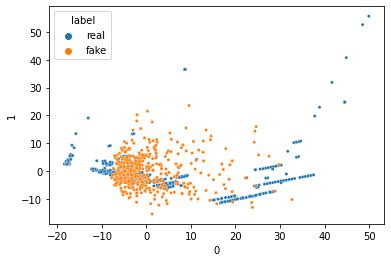

16/16 [==============================] - 0s 2ms/step


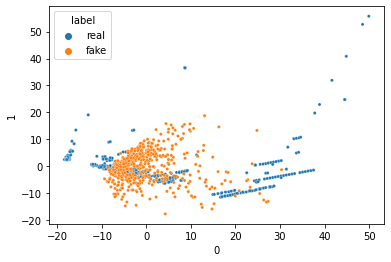

16/16 [==============================] - 0s 1ms/step


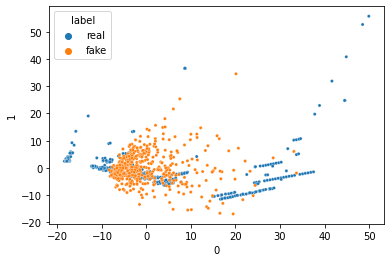

16/16 [==============================] - 0s 2ms/step


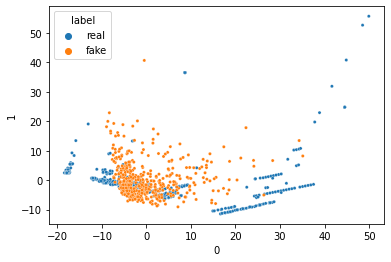

16/16 [==============================] - 0s 2ms/step


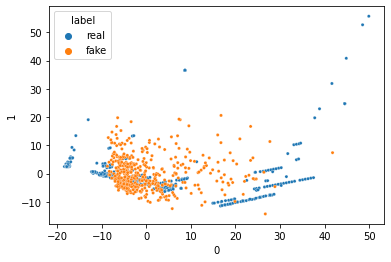

16/16 [==============================] - 0s 2ms/step


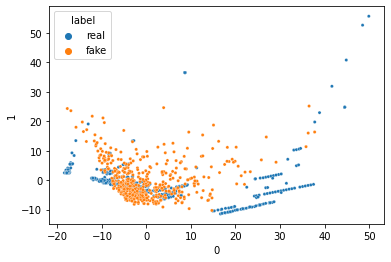

16/16 [==============================] - 0s 1ms/step


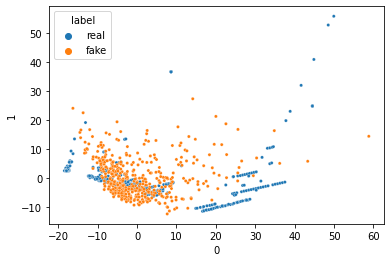

16/16 [==============================] - 0s 2ms/step


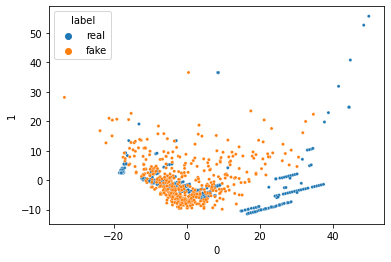

16/16 [==============================] - 0s 2ms/step


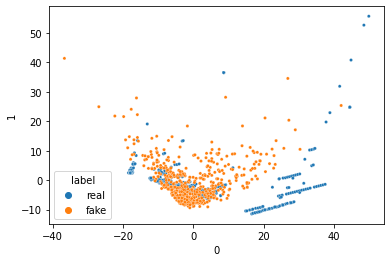

16/16 [==============================] - 0s 1ms/step


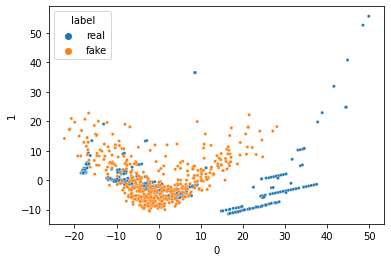

16/16 [==============================] - 0s 1ms/step


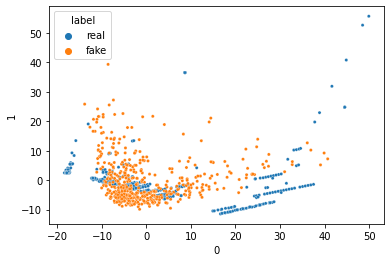

16/16 [==============================] - 0s 1ms/step


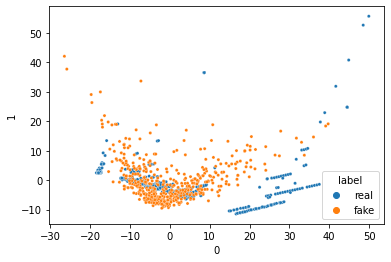

16/16 [==============================] - 0s 1ms/step


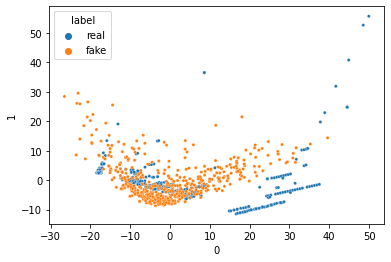

16/16 [==============================] - 0s 1ms/step


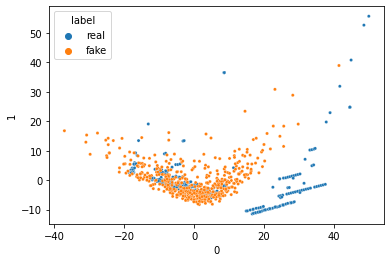

16/16 [==============================] - 0s 1ms/step


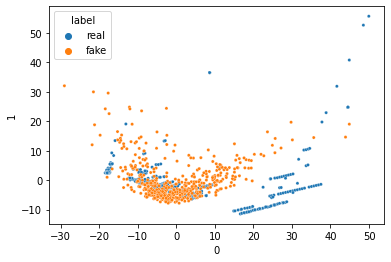

16/16 [==============================] - 0s 2ms/step


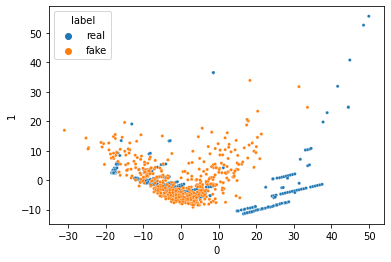

16/16 [==============================] - 0s 1ms/step


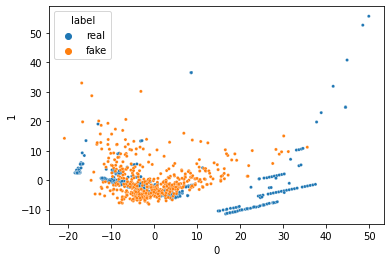

16/16 [==============================] - 0s 1ms/step


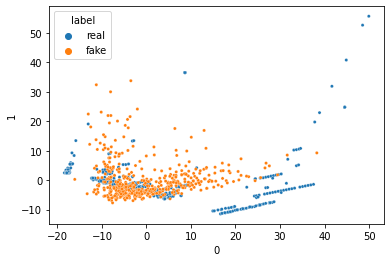

16/16 [==============================] - 0s 1ms/step


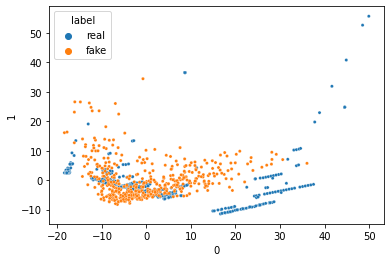

16/16 [==============================] - 0s 1ms/step


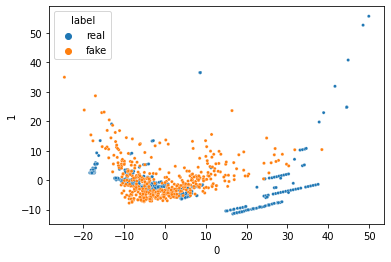

16/16 [==============================] - 0s 1ms/step


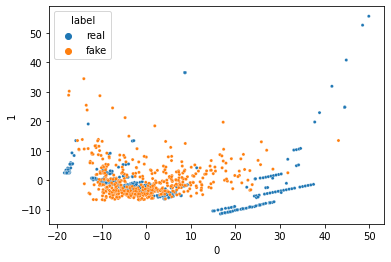

16/16 [==============================] - 0s 1ms/step


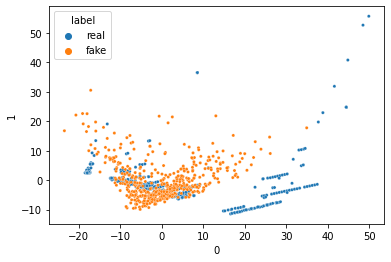

16/16 [==============================] - 0s 2ms/step


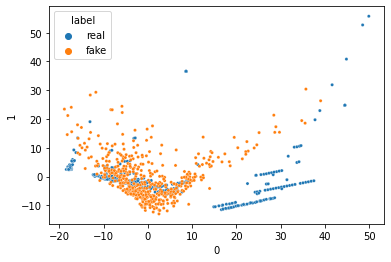

16/16 [==============================] - 0s 2ms/step


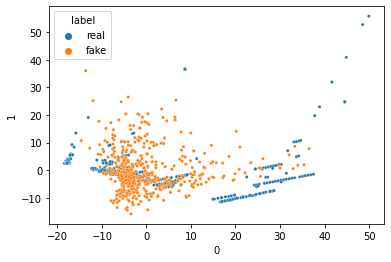

16/16 [==============================] - 0s 1ms/step


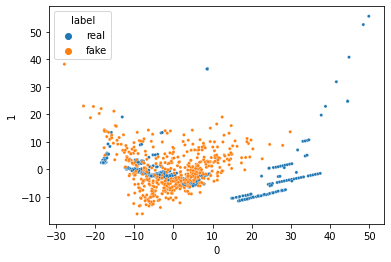

16/16 [==============================] - 0s 1ms/step


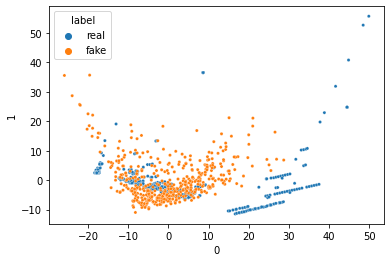

16/16 [==============================] - 0s 2ms/step


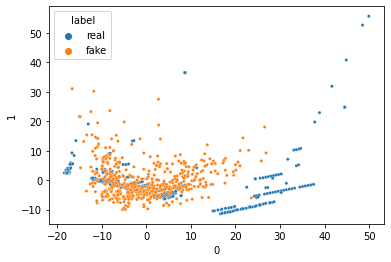

16/16 [==============================] - 0s 1ms/step


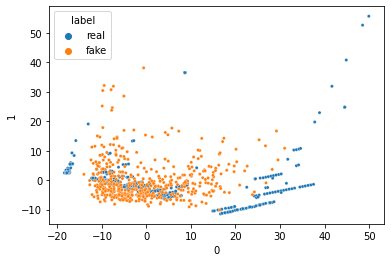

16/16 [==============================] - 0s 1ms/step


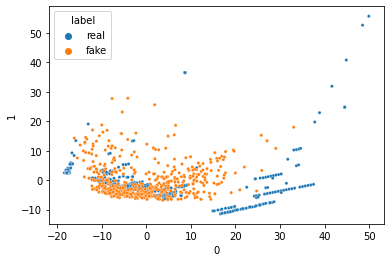

16/16 [==============================] - 0s 1ms/step


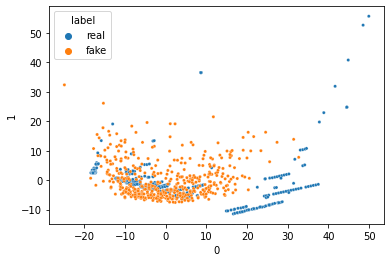

16/16 [==============================] - 0s 1ms/step


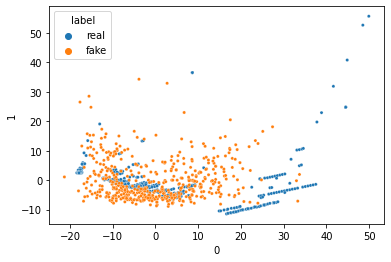

16/16 [==============================] - 0s 1ms/step


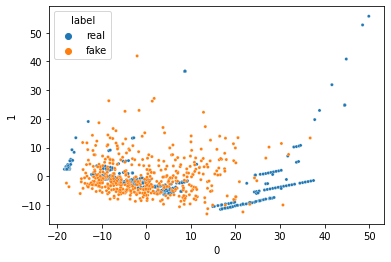

16/16 [==============================] - 0s 1ms/step


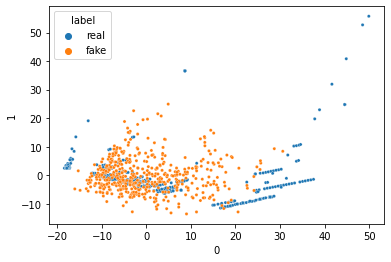

16/16 [==============================] - 0s 2ms/step


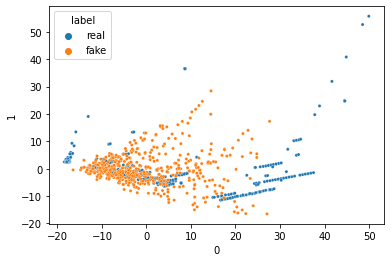

16/16 [==============================] - 0s 2ms/step


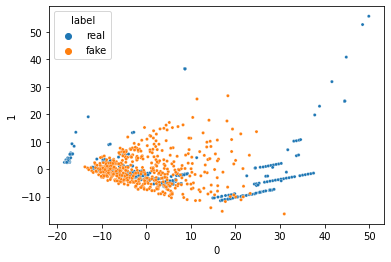

16/16 [==============================] - 0s 2ms/step


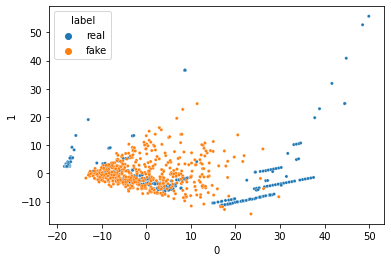

16/16 [==============================] - 0s 2ms/step


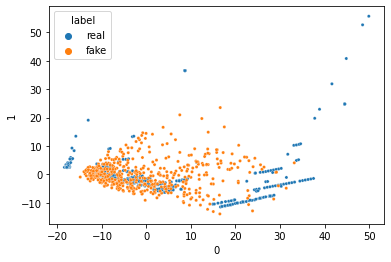

16/16 [==============================] - 0s 2ms/step


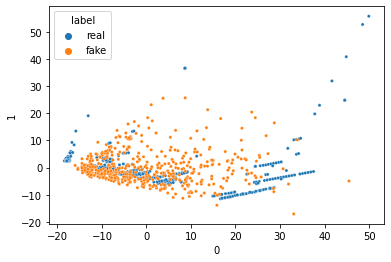

16/16 [==============================] - 0s 1ms/step


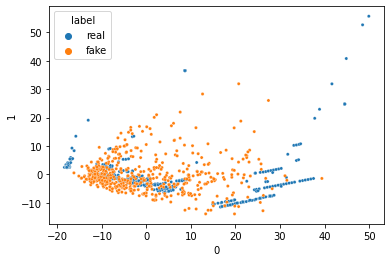

16/16 [==============================] - 0s 2ms/step


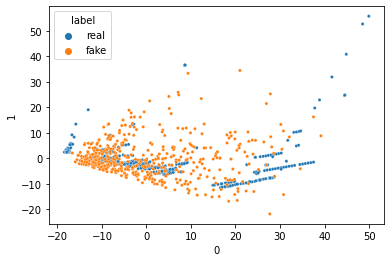

16/16 [==============================] - 0s 2ms/step


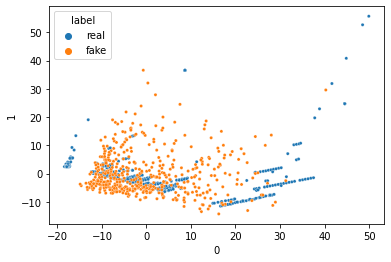

16/16 [==============================] - 0s 2ms/step


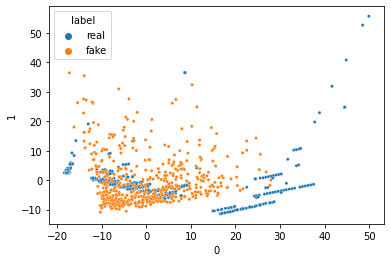

16/16 [==============================] - 0s 2ms/step


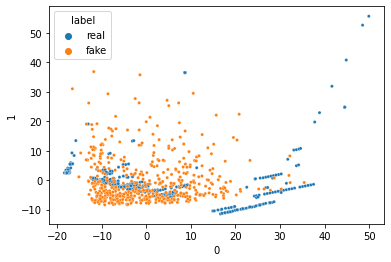

16/16 [==============================] - 0s 1ms/step


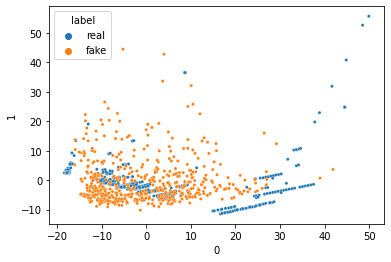

16/16 [==============================] - 0s 2ms/step


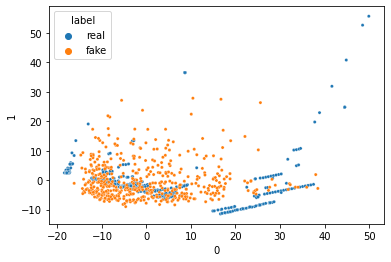

16/16 [==============================] - 0s 2ms/step


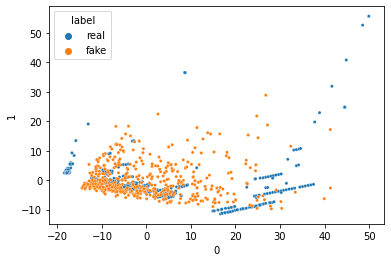

16/16 [==============================] - 0s 3ms/step


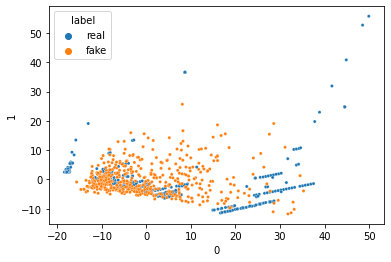

16/16 [==============================] - 0s 1ms/step


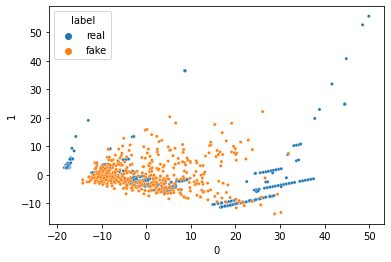

16/16 [==============================] - 0s 2ms/step


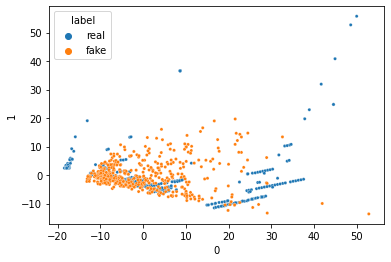

16/16 [==============================] - 0s 2ms/step


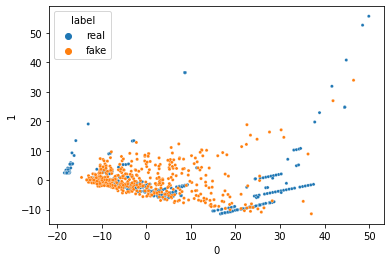

16/16 [==============================] - 0s 1ms/step


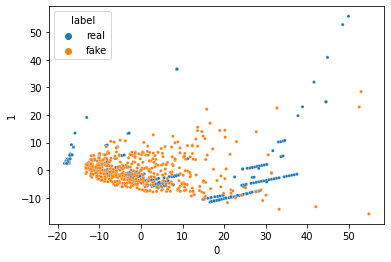

16/16 [==============================] - 0s 2ms/step


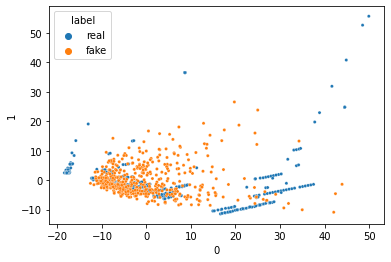

16/16 [==============================] - 0s 1ms/step


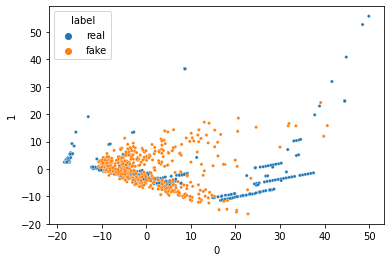

16/16 [==============================] - 0s 1ms/step


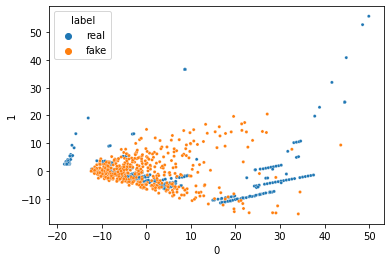

16/16 [==============================] - 0s 1ms/step


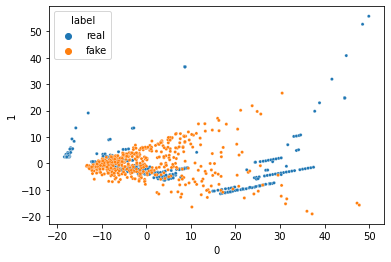

16/16 [==============================] - 0s 2ms/step


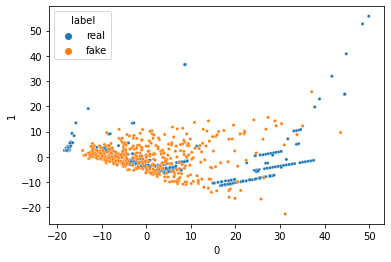

16/16 [==============================] - 0s 2ms/step


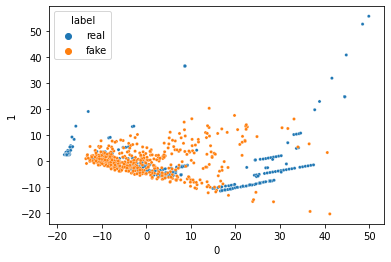

16/16 [==============================] - 0s 1ms/step


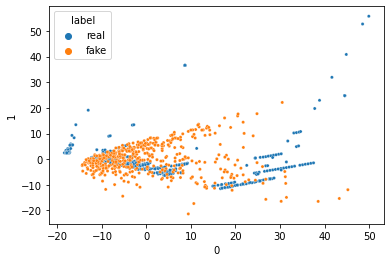

16/16 [==============================] - 0s 1ms/step


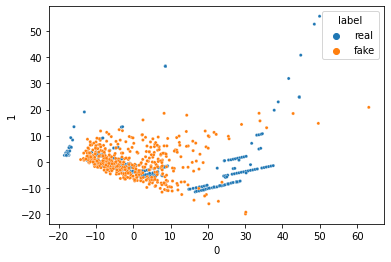

16/16 [==============================] - 0s 1ms/step


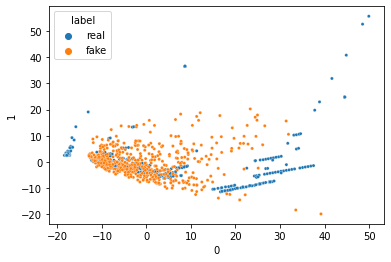

16/16 [==============================] - 0s 2ms/step


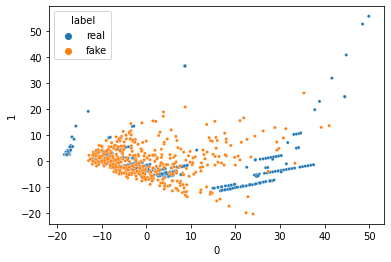

16/16 [==============================] - 0s 2ms/step


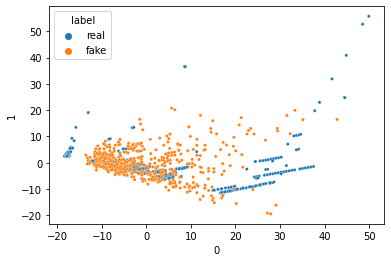

16/16 [==============================] - 0s 2ms/step


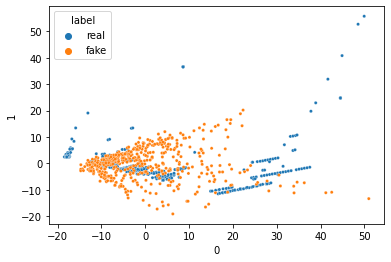

16/16 [==============================] - 0s 1ms/step


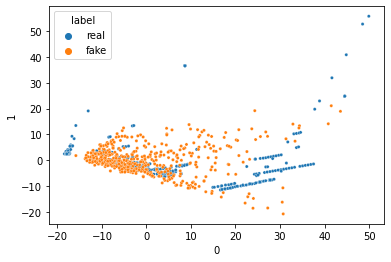

16/16 [==============================] - 0s 2ms/step


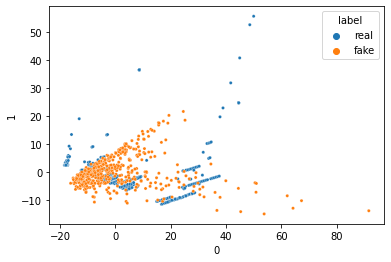

16/16 [==============================] - 0s 1ms/step


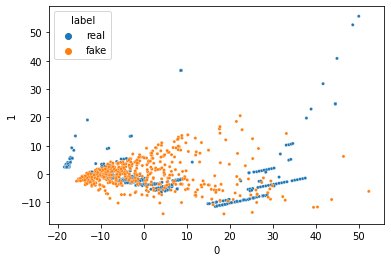

16/16 [==============================] - 0s 1ms/step


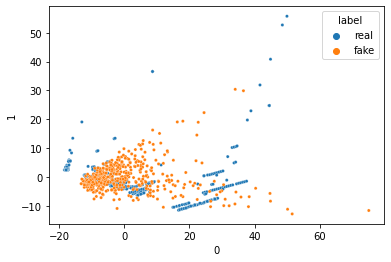

16/16 [==============================] - 0s 2ms/step


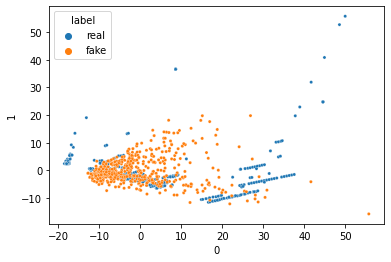

16/16 [==============================] - 0s 2ms/step


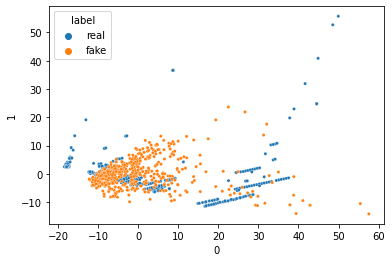

16/16 [==============================] - 0s 1ms/step


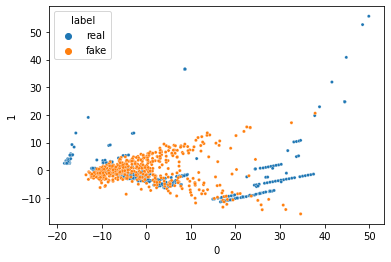

16/16 [==============================] - 0s 1ms/step


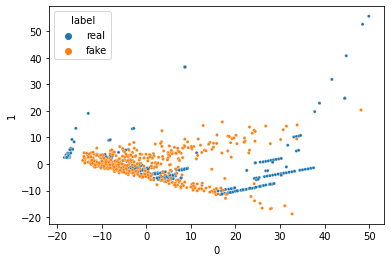

1/1 [==============================] - 0s 21ms/step


In [18]:
generator = build_generator()
discriminator = build_discriminator()
gan = build_gan(generator,discriminator)
gan.compile(optimizer = 'adam', loss = 'binary_crossentropy')

num_epochs = 1000
batch_size = 64
half_batch = int(batch_size/2)

for epoch in range(num_epochs):
    x_fake = generate_synthetic_data(generator , half_batch)
    y_fake = np.zeros((half_batch, 1))

    x_real = data_fraud.drop("Class",axis=1).sample(half_batch)
    y_real = np.ones((half_batch,1))

    discriminator.trainable = True
    discriminator.train_on_batch(x_real, y_real)
    discriminator.train_on_batch(x_fake, y_fake)

    noise = np.random.normal(0,1,(batch_size,29))
    gan.train_on_batch(noise, np.ones((batch_size,1)))

    if epoch % 10 ==0:
       monitor_generator(generator)





### Step 7 - Generate synthetic data using the trained Generator

*   Generate 1000 fradulent data points using the trained generator
*   Compare the distribution of `real` and `synthetic` fradulent data points.


In [19]:
synthetic_data = generate_synthetic_data(generator,1000)
df = pd.DataFrame(synthetic_data)
df['label'] = 'fake'

df2 = data_fraud.drop('Class',axis = 1)
df2['label'] = 'real'
df2.columns = df.columns

combined_df = pd.concat([df, df2])
combined_df


32/32 [==============================] - 0s 2ms/step


,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,label
0,-2.193200,4.149005,-9.338690,9.641824,-6.822965,-2.646130,-8.630990,5.135810,-4.045934,-8.884224,...,1.888510,1.040002,-0.479083,3.376262,-1.227419,-0.509788,-0.071607,1.527209,3.222203,fake
1,-0.317316,1.128133,-3.663853,3.076102,-0.419513,-1.789273,-1.267020,0.085290,-1.842239,-3.711060,...,0.628030,-0.240174,0.577461,-0.687628,0.483205,0.082865,0.553668,1.632464,-0.054087,fake
2,-1.918641,3.722521,-6.866642,7.188468,-4.688410,-1.334257,-5.985995,3.595941,-3.247472,-6.699478,...,0.996335,0.889007,-0.021873,2.063026,-0.967877,-0.259355,0.693703,1.273111,1.800213,fake
3,-2.109694,4.909288,-13.676929,12.215615,-10.142552,-5.658713,-10.149074,7.431693,-3.843721,-13.438590,...,4.105733,0.242436,0.046350,4.664879,-0.216864,0.326299,-0.328098,1.470800,4.749614,fake
4,-8.061525,6.153301,-7.489999,8.849437,0.999139,-1.115249,-7.427639,0.316691,-6.653925,-7.734253,...,-2.033021,2.756479,0.265889,0.192178,-2.028561,-0.303857,0.900013,4.915740,1.379495,fake
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50487,-1.927883,1.125653,-4.518331,1.749293,-1.566487,-2.010494,-0.882850,0.697211,-2.064945,-5.587794,...,0.778584,-0.319189,0.639419,-0.294885,0.537503,0.788395,0.292680,0.147968,1.277825,real
50488,1.378559,1.289381,-5.004247,1.411850,0.442581,-1.326536,-1.413170,0.248525,-1.127396,-3.232153,...,0.370612,0.028234,-0.145640,-0.081049,0.521875,0.739467,0.389152,0.186637,-0.369281,real
50489,-0.676143,1.126366,-2.213700,0.468308,-1.120541,-0.003346,-2.234739,1.210158,-0.652250,-3.463891,...,0.751826,0.834108,0.190944,0.032070,-0.739695,0.471111,0.385107,0.194361,-0.042898,real
50490,-3.113832,0.585864,-5.399730,1.817092,-0.840618,-2.943548,-2.208002,1.058733,-1.632333,-5.245984,...,0.583276,-0.269209,-0.456108,-0.183659,-0.328168,0.606116,0.884876,-0.253700,0.664244,real


Checking the individual feature distribution of `synthetic` and `real` fraud data.

In [20]:
for col in combined_df.columns:
   plt.figure()
   fig = px.histogram(combined_df, color = 'label', x=col,barmode="overlay", title = f'Feature {col}', width = 640, height = 500)
   fig.show()

C:\Users\Rishab\AppData\Local\Temp\ipykernel_35272\2367499593.py:2: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

# Step 8: Building the Fraud Detection Model

Random Forest Evaluation:
Accuracy: 0.9900
Precision: 0.9855
Recall: 1.0000
F1-score: 0.9927



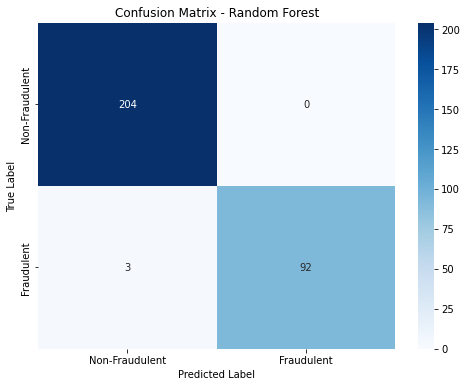


Support Vector Machine Evaluation:
Accuracy: 0.9365
Precision: 0.9148
Recall: 1.0000
F1-score: 0.9555



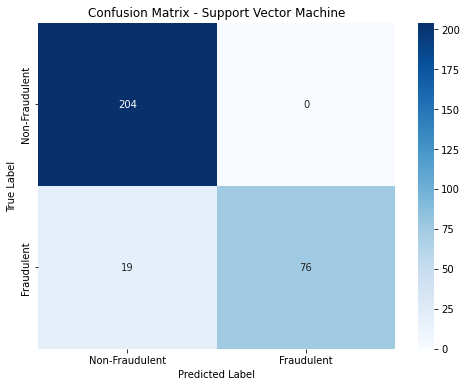


K-Nearest Neighbors Evaluation:
Accuracy: 0.9465
Precision: 0.9273
Recall: 1.0000
F1-score: 0.9623



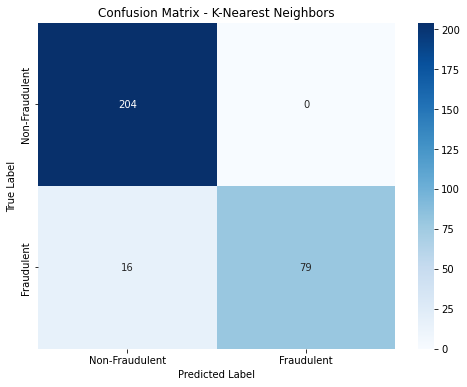


Naive Bayes Evaluation:
Accuracy: 0.8060
Precision: 0.7808
Recall: 0.9951
F1-score: 0.8750



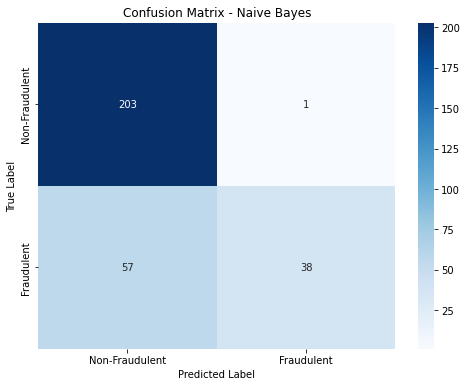

In [21]:
# Shuffle the combined data
combined_df = combined_df.sample(frac=1).reset_index(drop=True)

# Split features and labels
x_combined = combined_df.drop("label", axis=1)
y_combined = combined_df["label"]  # Added quotes around label

# Splitting the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x_combined, y_combined, test_size=0.2, random_state=42)

# Model 1: Random Forest
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(x_train, y_train)  # Changed X_train to x_train
rf_predictions = rf_model.predict(x_test)  # Changed X_test to x_test

# Model 2: Support Vector Machine (SVM)
svm_model = SVC(kernel='rbf', gamma='scale', random_state=42)
svm_model.fit(x_train, y_train)  # Changed X_train to x_train
svm_predictions = svm_model.predict(x_test)  # Changed X_test to x_test

# Model 3: K-Nearest Neighbors (KNN)
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(x_train, y_train)  # Changed X_train to x_train
knn_predictions = knn_model.predict(x_test)  # Changed X_test to x_test

# Model 4: Naive Bayes
nb_model = GaussianNB()
nb_model.fit(x_train, y_train)
nb_predictions = nb_model.predict(x_test)


# Define a function to print evaluation metrics
def print_evaluation_metrics(y_true, y_pred):
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, pos_label='fake')
    recall = recall_score(y_true, y_pred, pos_label='fake')
    f1 = f1_score(y_true, y_pred, pos_label='fake')

    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'Recall: {recall:.4f}')
    print(f'F1-score: {f1:.4f}')

# Evaluate models
models = {'Random Forest': rf_predictions, 'Support Vector Machine': svm_predictions, 'K-Nearest Neighbors': knn_predictions, 'Naive Bayes': nb_predictions}
for name, predictions in models.items():
    print(f'{name} Evaluation:')
    print_evaluation_metrics(y_test, predictions)
    print()

    # Plot confusion matrix
    cm = confusion_matrix(y_test, predictions)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Non-Fraudulent', 'Fraudulent'], yticklabels=['Non-Fraudulent', 'Fraudulent'])
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title(f'Confusion Matrix - {name}')
    plt.show()
    print()

